# Standing wave

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation

from JSAnimation import IPython_display

In [2]:
T = 20.
w = 2 * np.pi / T
ai = 1.  # Incident.
ar = 0.5  # Reflected.
d = 0
k = w**2 / 9.81  # Deep water wave.

t = np.arange(0, 100.5, 0.5)

In [6]:
def basic_animation(frames=100, interval=30):
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.axis([0, 1000, -2, 2])
    
    # Animated.
    line, = ax.plot([], [], 'b', lw=2)
    text = ax.text(1, 2.05, '')

    # Non-animated.
    x = np.arange(0, 1001)
    A = (ai**2 + ar**2 + 2*ai * ar * np.cos(2 * k * x + d))**(0.5)
    A1 = ai * np.cos(k * x) + ar * np.cos(k * x + d)
    A2 = ai * np.sin(k * x) - ar * np.sin(k * x + d)
    gamma = np.arctan2(A2, A1)
    ax.set_xlabel('Distance [m]')
    ax.set_ylabel('Surface Elevation [m]')
    ax.set_title('a_i = %s, a_r = %s, T = %s\nDeep Water Wave' % (ai, ar, T))
    ax.plot(x,  A, 'k:')
    ax.plot(x, -A, 'k:')
    ax.plot(x, [0]*len(x), 'k')
    line.set_data([], [])
    
    def init():
        return line, text

    def animate(i):
        text.set_text('Time [s] = %s' % t[k])
        y = A * np.cos(w * t[i] - gamma)
        line.set_data(x, y)
        return line, text

    return animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=interval)

In [7]:
frames = len(t)

ani = basic_animation(frames=frames)

ani.save('animation_standing_wave.gif', writer='imagemagick', fps=100)


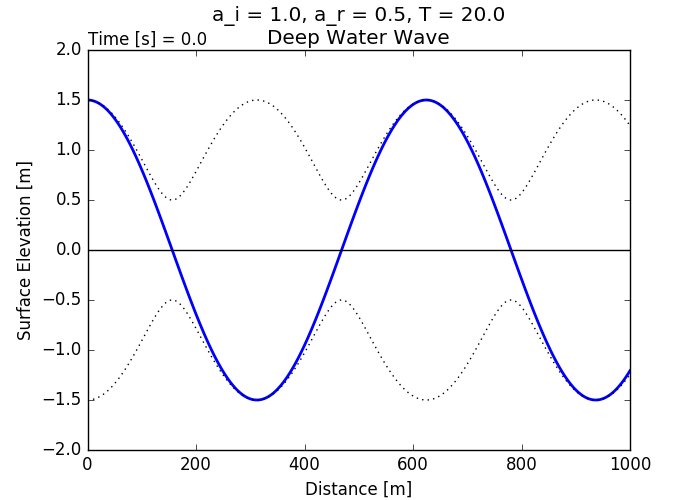
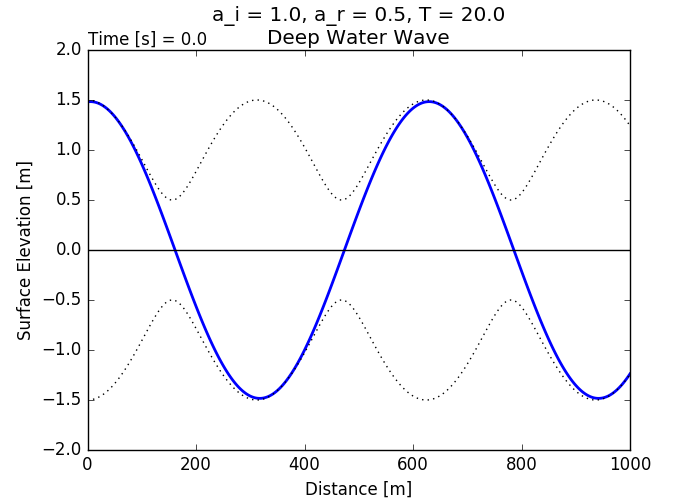
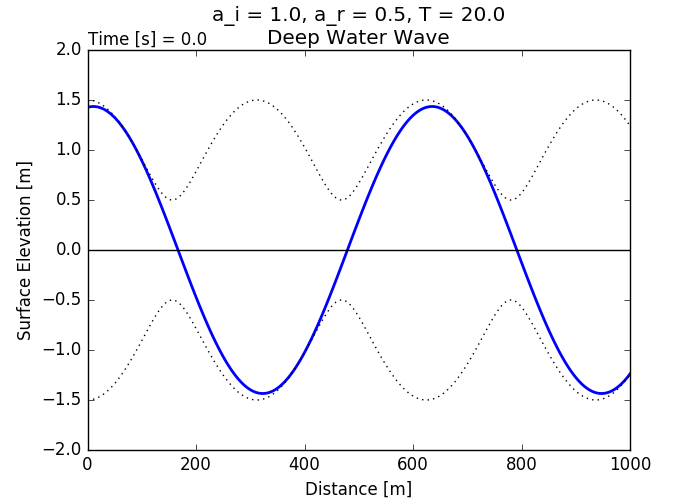
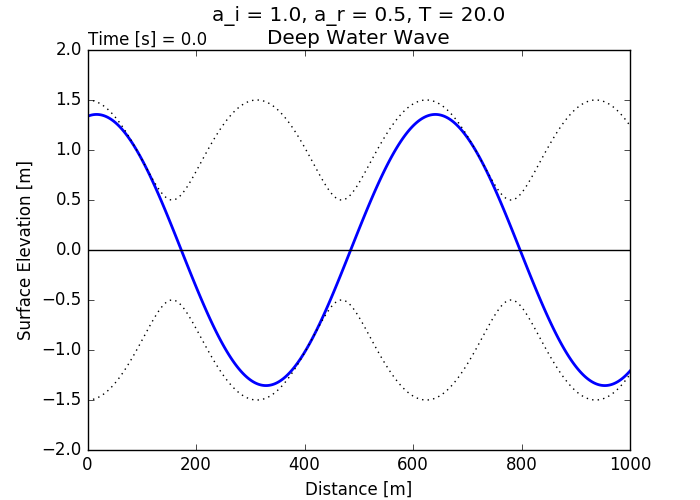
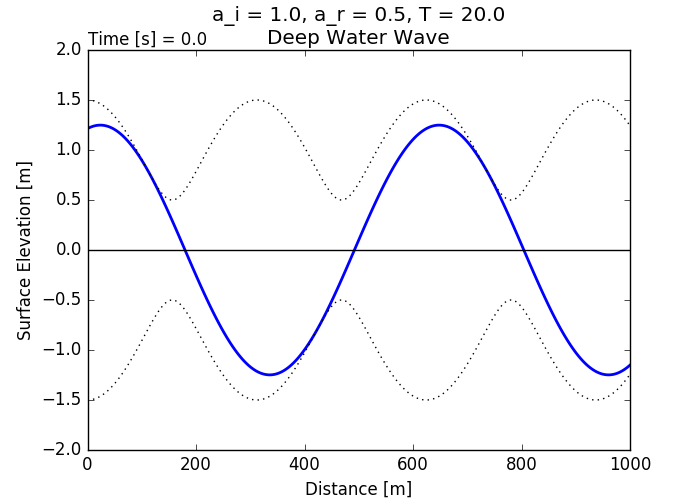
...
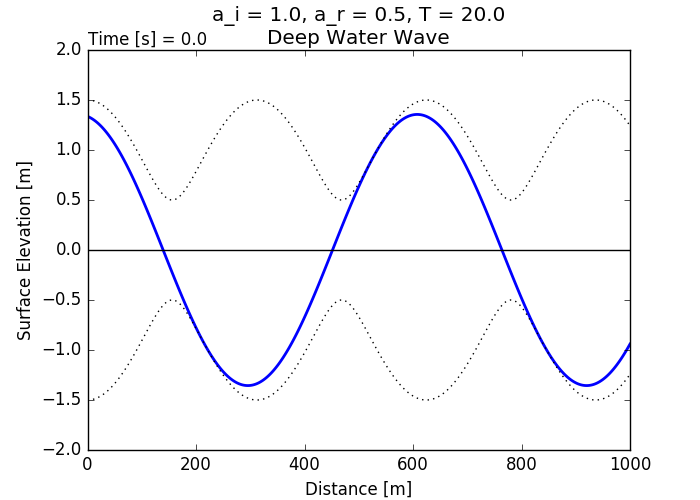
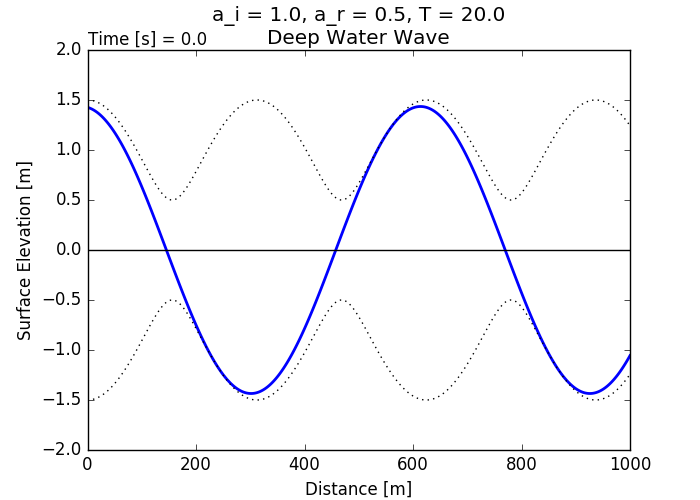
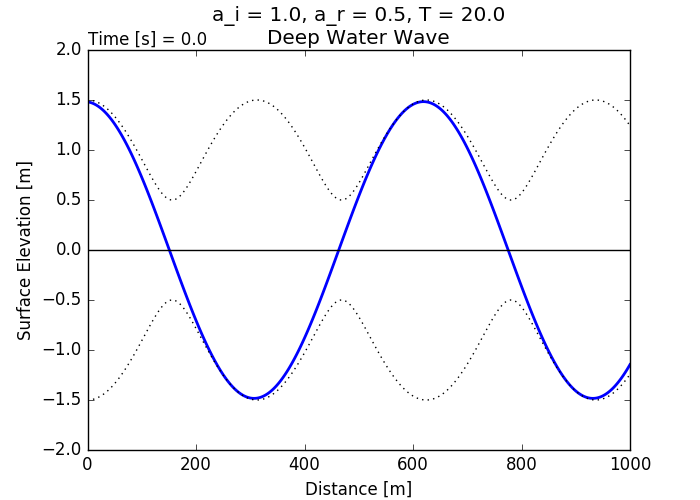
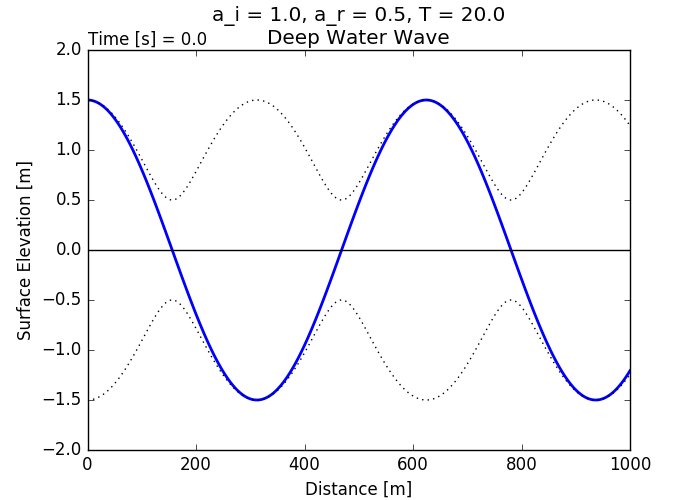
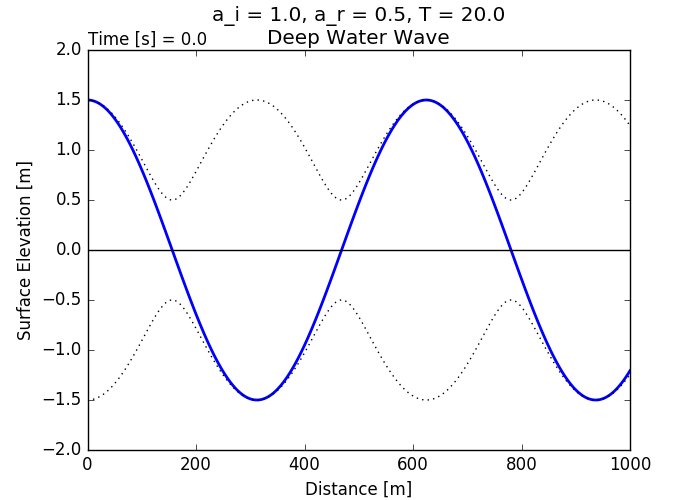

In [8]:
ani